# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
import tensorflow as tf

2022-09-28 19:20:16.141645: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-09-28 19:20:16.263070: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-09-28 19:20:16.263095: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-09-28 19:20:16.289553: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-09-28 19:20:16.967571: W tensorflow/stream_executor/pla

In [2]:
whole_dataset = get_dataset("./data/processed/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['./data/processed/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['./data/processed/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 100
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


2022-09-28 19:20:18.383781: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-09-28 19:20:18.383851: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2022-09-28 19:20:18.383892: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2022-09-28 19:20:18.385649: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcusolver.so.11'; dlerror: libcusolver.so.11: cannot open shared object file: No such file or directory
2022-09-28 19:20:18.385701: W tensorflow/stream_executor/platform/default/dso_loader

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    
    colormap = {1:'red', 2:'blue', 4:'green'}
    
    image = batch["image"].numpy()
    gt_boxes = batch["groundtruth_boxes"].numpy()
    gt_classes = batch["groundtruth_classes"].numpy()
    
    w, h = image.shape[:2]
    
    gt_boxes[:, [0, 2]] *= h
    gt_boxes[:, [1, 3]] *= w
    
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(image)
    for bb, cl in zip(gt_boxes, gt_classes):
        y1, x1, y2, x2 = bb
        rec = patches.Rectangle((x1, y1), x2-x1, y2-y1, facecolor='none', edgecolor=colormap[cl])
        ax.add_patch(rec)
    plt.show()

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

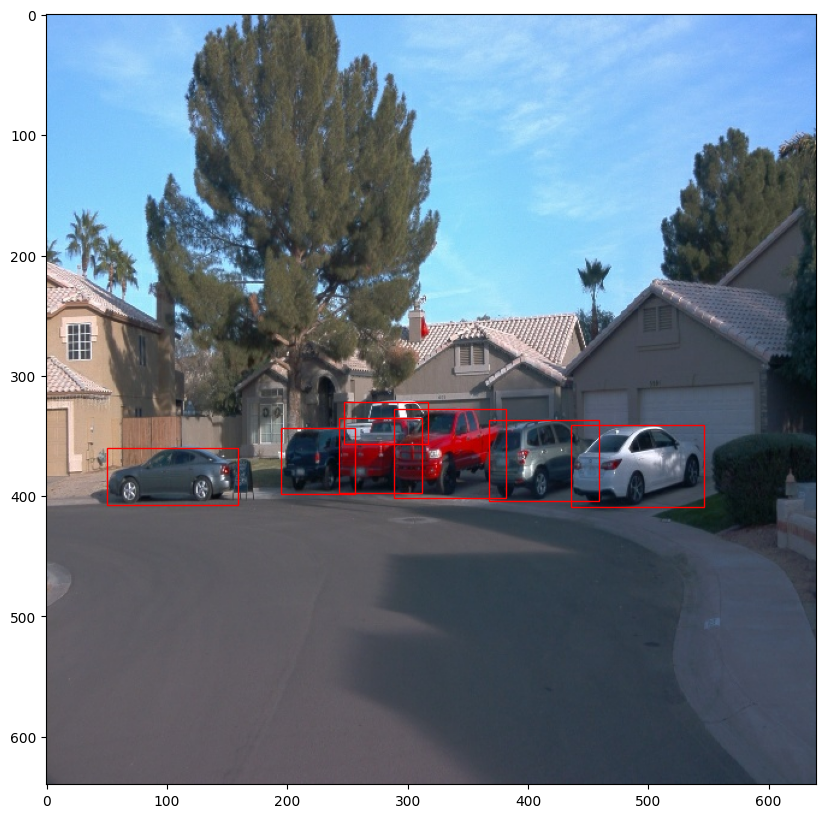

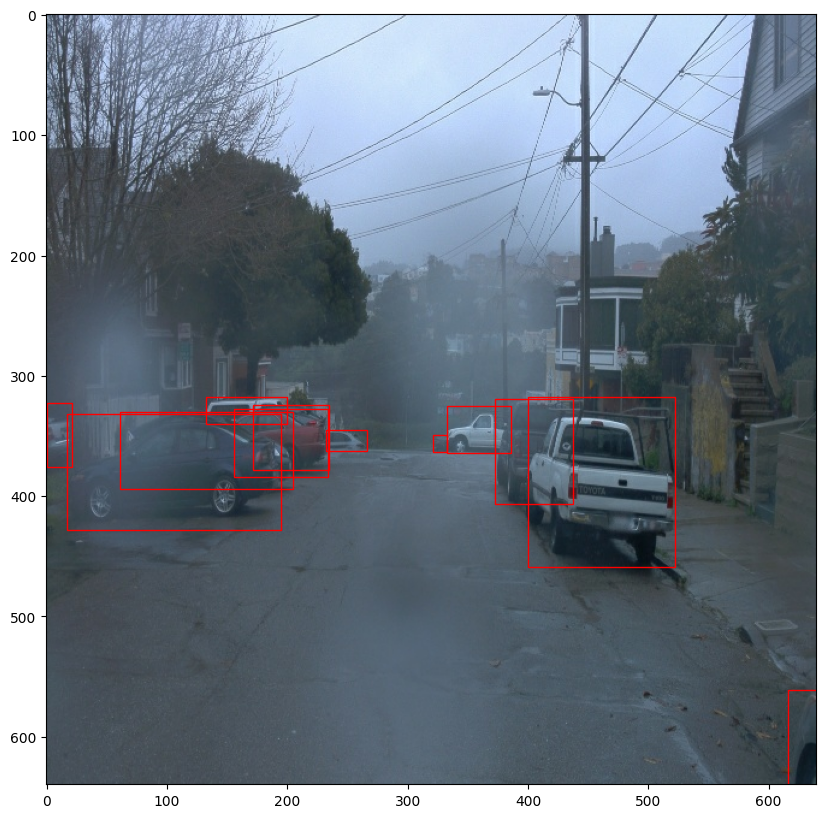

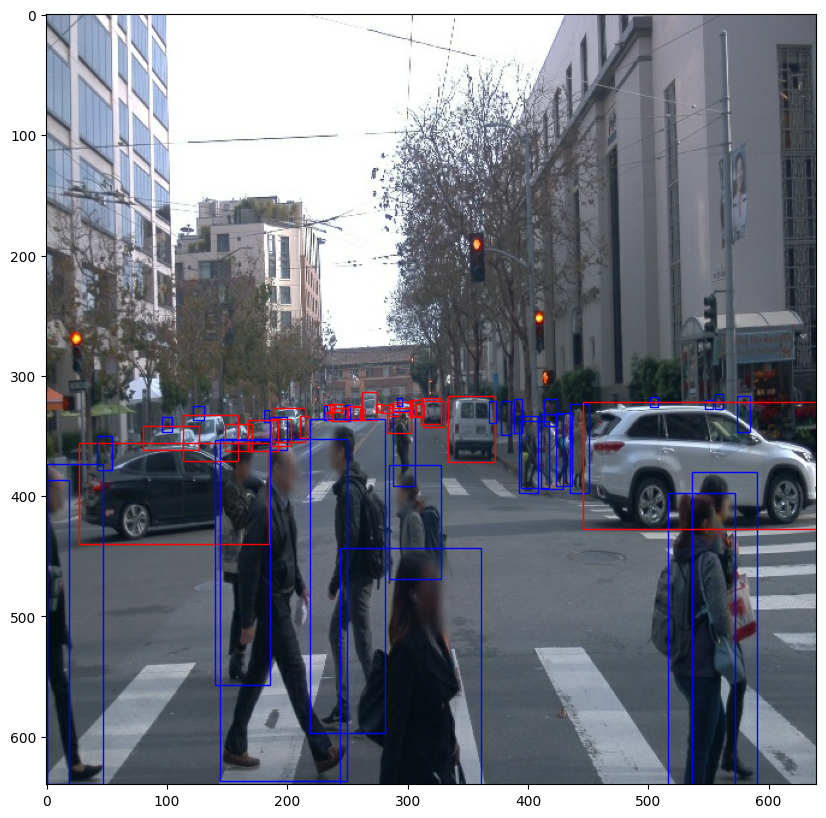

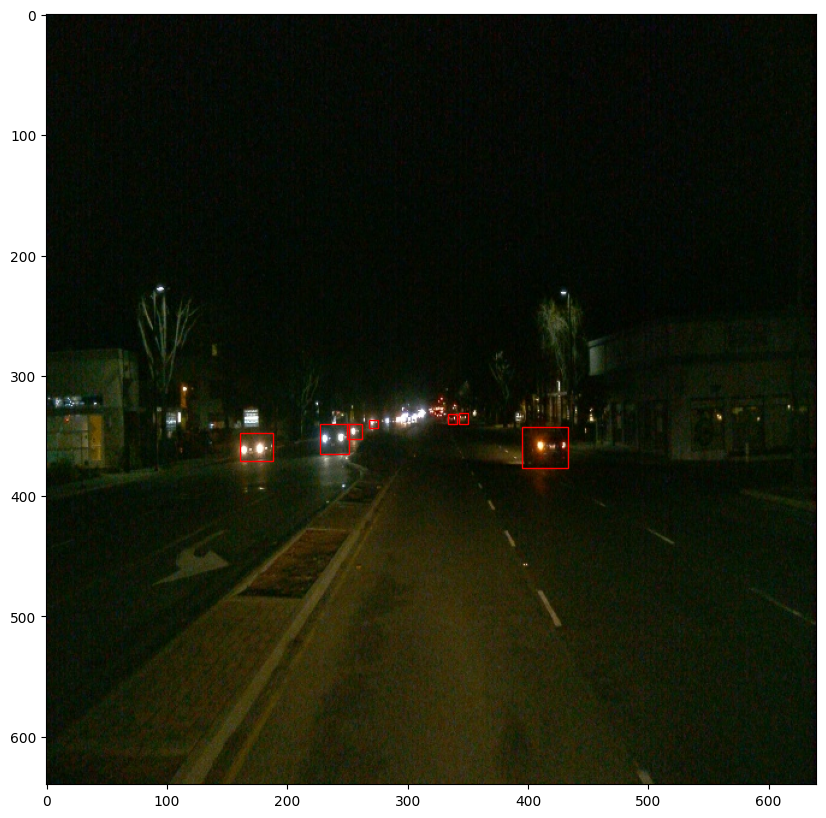

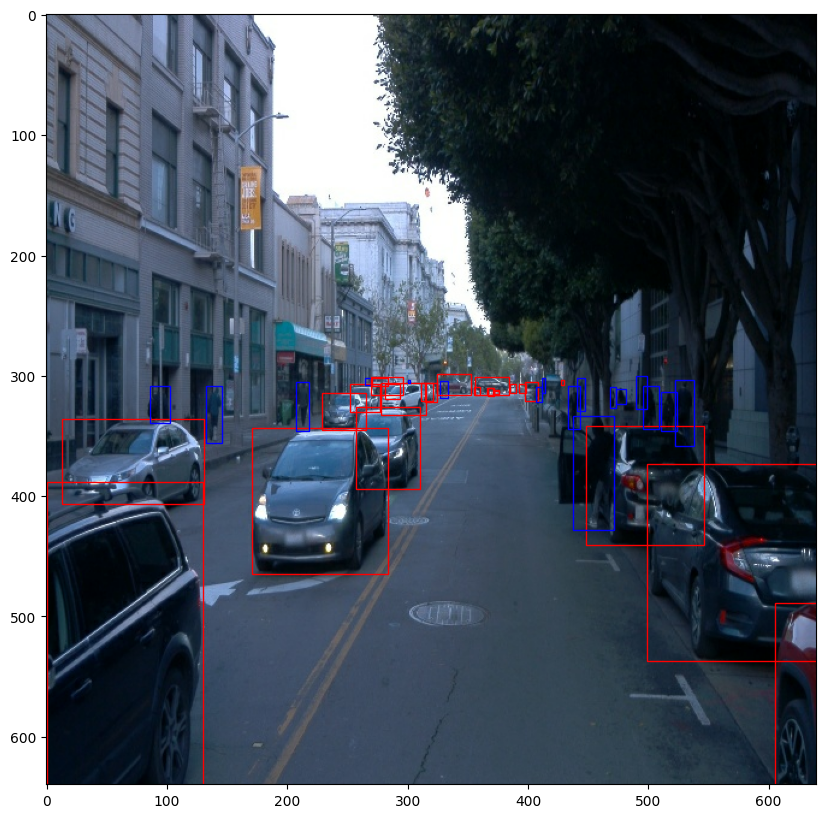

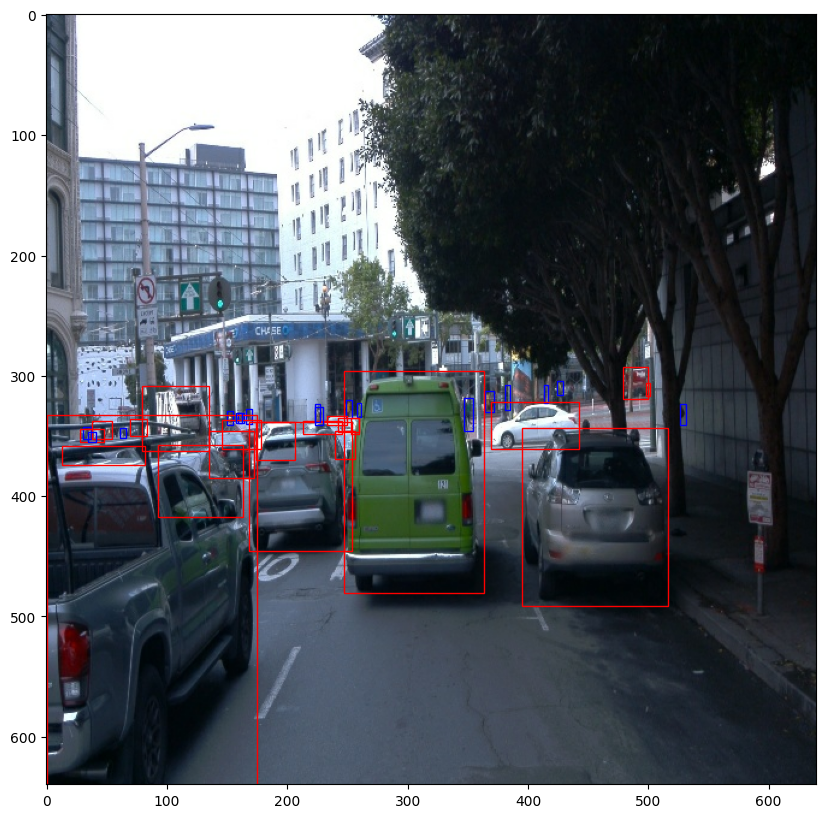

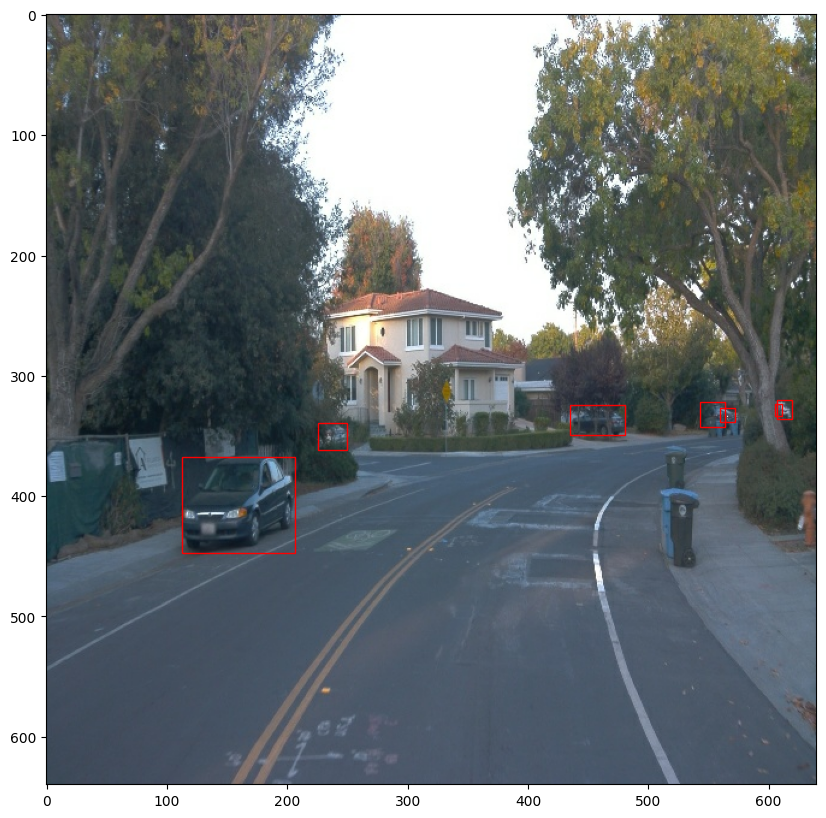

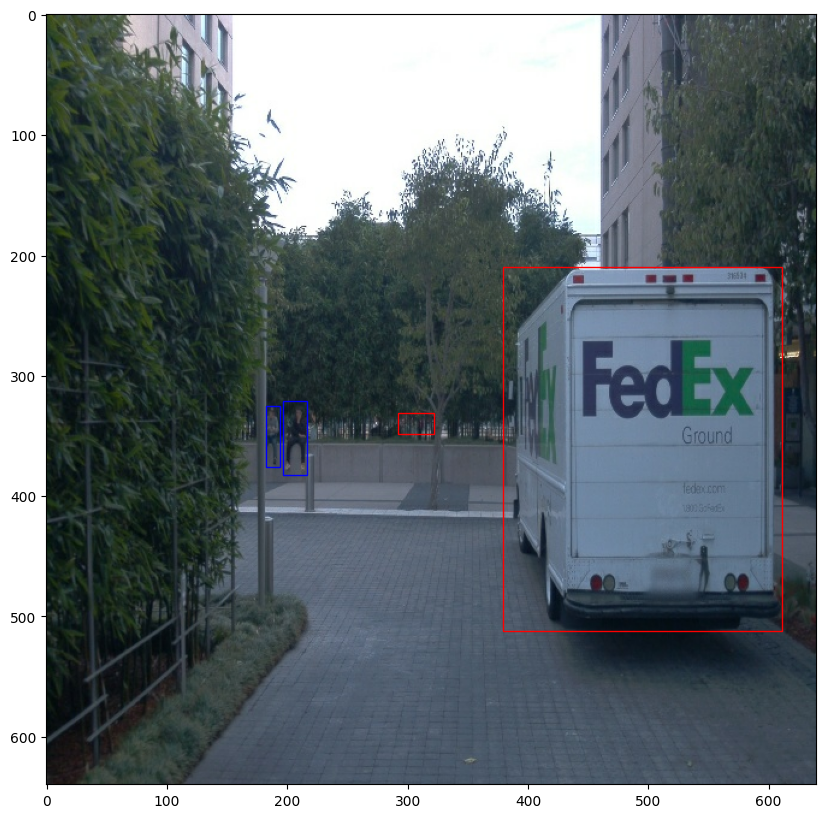

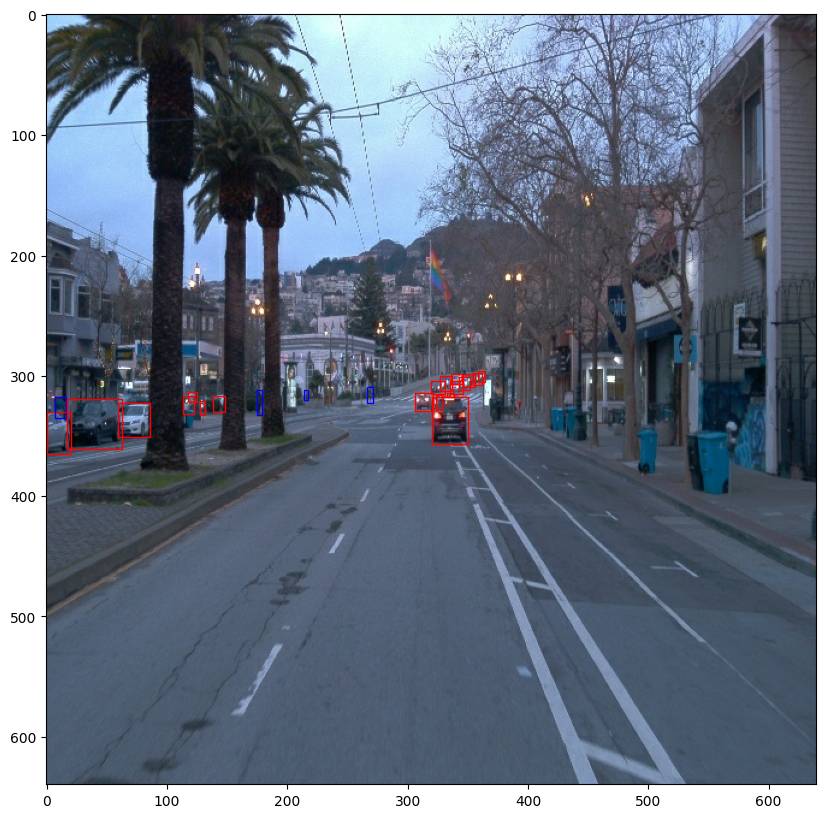

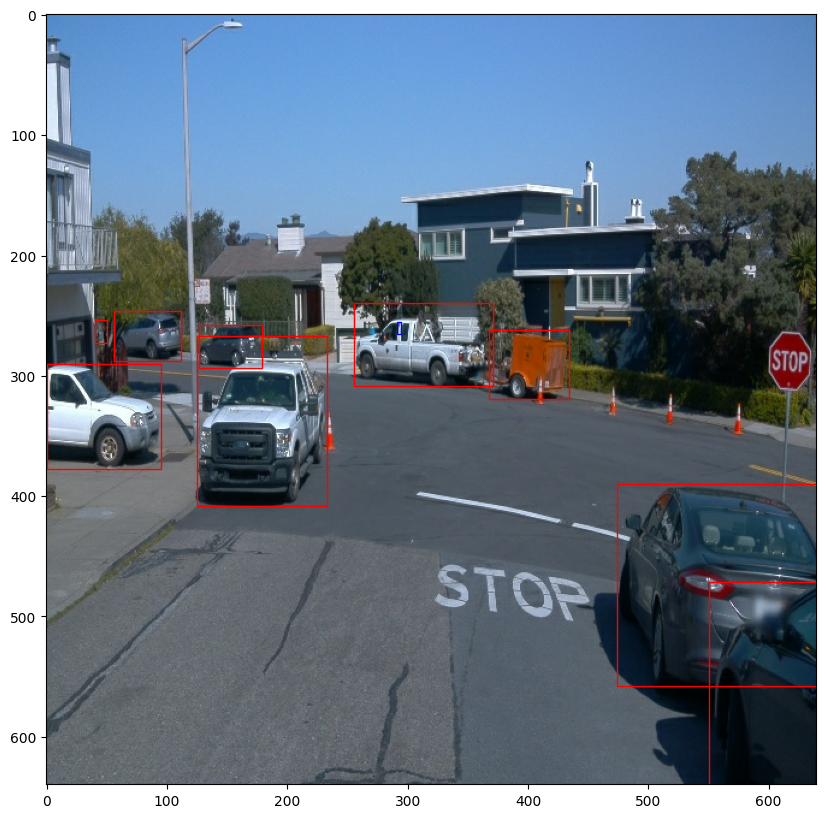

In [4]:
%matplotlib inline

## STUDENT SOLUTION HERE

dataset = whole_dataset.shuffle(100).take(10)

for batch in dataset:
    display_instances(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

### a glimpse of the data

In [5]:
for batch in dataset:
    for key in batch.keys():
        print(f"{key}, {batch[key]}")
    break

image, [[[210 227 253]
  [205 222 248]
  [207 224 250]
  ...
  [210 239 245]
  [211 240 246]
  [221 250 255]]

 [[208 225 251]
  [208 225 251]
  [206 223 249]
  ...
  [214 243 249]
  [215 244 250]
  [213 242 248]]

 [[207 224 250]
  [208 225 251]
  [209 226 252]
  ...
  [220 249 255]
  [218 247 253]
  [212 241 247]]

 ...

 [[ 72  79  89]
  [ 71  78  88]
  [ 71  78  88]
  ...
  [ 70  78  89]
  [ 70  78  89]
  [ 71  79  90]]

 [[ 72  76  87]
  [ 72  76  87]
  [ 75  79  90]
  ...
  [ 70  78  89]
  [ 69  77  88]
  [ 69  77  88]]

 [[ 81  85  96]
  [ 78  82  93]
  [ 77  81  92]
  ...
  [ 71  79  90]
  [ 69  77  88]
  [ 69  77  88]]]
source_id, b'segment-10072231702153043603_5725_000_5745_000_with_camera_labels_80.tfrecord'
key, b''
filename, b'segment-10072231702153043603_5725_000_5745_000_with_camera_labels_80.tfrecord'
groundtruth_image_confidences, []
groundtruth_verified_neg_classes, []
groundtruth_not_exhaustive_classes, []
groundtruth_boxes, [[0.5168676  0.4747616  0.5336442  0.48972

In [6]:
import glob

data_dir = "./data/processed/"

files = glob.glob(data_dir + '*.tfrecord')

# how many files are there in one tfrecord file?
for file in files:
    dataset = tf.data.TFRecordDataset(file)

    total = 0
    for data in dataset:
        total += 1
    if total != 20:
        print(file, "has only", total, "images")

./data/processed/segment-11971497357570544465_1200_000_1220_000_with_camera_labels.tfrecord has only 18 images
./data/processed/segment-10975280749486260148_940_000_960_000_with_camera_labels.tfrecord has only 19 images


In [7]:
from collections import Counter

def count_instances(dataset):
    counter = Counter()
    
    for _, data in enumerate(dataset):
        cls = data['groundtruth_classes'].numpy()
        counter.update(Counter(cls).elements())
        
    counter = dict(counter)
    
    return counter

In [53]:
test_dataset = get_dataset(files[0])
class_test_dataset = count_instances(whole_dataset.take(1000))

INFO:tensorflow:Reading unweighted datasets: ['./data/processed/segment-12161824480686739258_1813_380_1833_380_with_camera_labels.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['./data/processed/segment-12161824480686739258_1813_380_1833_380_with_camera_labels.tfrecord']
INFO:tensorflow:Number of filenames to read: 1


In [54]:
class_test_dataset

{1: 18393, 2: 5718, 4: 115}

<BarContainer object of 3 artists>

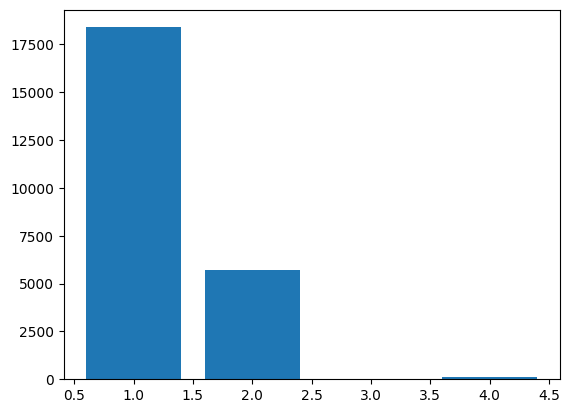

In [55]:
plt.bar(class_test_dataset.keys(), class_test_dataset.values())
#fig1.savefig('../../assets/cls_distribution.png')